In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_masks.npy')

In [3]:
X_test = images[1700:2141]
y_test = masks[1700:2141]

In [4]:
images = images[0:1700]
masks = masks[0:1700]

In [5]:
barebone_model = '/tmp/tmp7h8stef3kuc_unet2d/kuc_unet2d_0kuc_unet2d_model'

In [6]:
images.shape

(1700, 512, 512, 1)

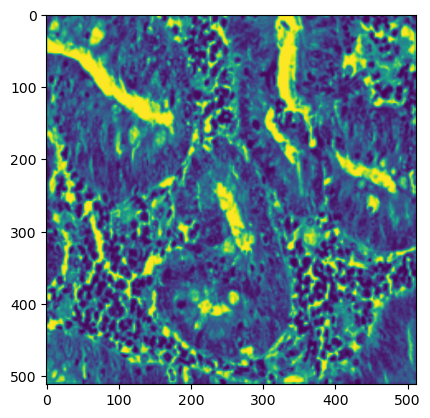

In [7]:
imshow(images[100])

In [8]:
masks.shape

(1700, 512, 512, 1)

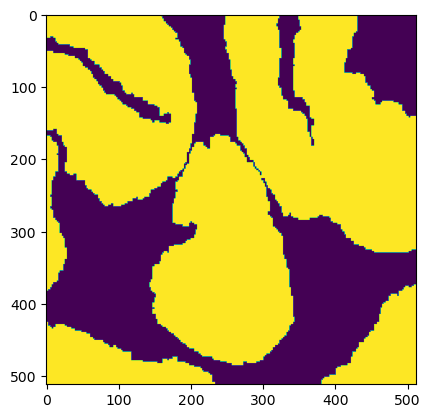

In [9]:
imshow(masks[100])

In [10]:
import sys
sys.path.append('../')
import gp2

In [11]:
from keras import losses

In [12]:
loss_fx = losses.BCE

In [13]:
C = gp2.KUC_UNet2D(loss=loss_fx, model_path=barebone_model)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpuxo5doqzkuc_unet2d


In [14]:
from runner import Runner
R = Runner(verbose=True, workingdir=C.workingdir)

*** GP2 ***
Working directory: /tmp/tmpuxo5doqzkuc_unet2d
Verbose mode active!


In [15]:
R.classifier = C ### use custom classifier

In [16]:
R.run(images, masks, runs=5, batch_size=16, shuffle=True, results_file='/raid/mpsych/OMAMA/GP2/results/kuc_unet2d_0kuc_unet2d_model_2_5_EBHI_filtered.pkl')

Shuffling data...
Weights OK!
******
Loop 1
Epoch 1/100
6/6 [==============================] - 20s 2s/step - loss: 0.2827 - dice_coeff: 0.8669 - val_loss: 0.2881 - val_dice_coeff: 0.8839
Epoch 2/100
6/6 [==============================] - 3s 498ms/step - loss: 0.2573 - dice_coeff: 0.8919 - val_loss: 0.2935 - val_dice_coeff: 0.8827
Epoch 3/100
6/6 [==============================] - 3s 482ms/step - loss: 0.2494 - dice_coeff: 0.8852 - val_loss: 0.2842 - val_dice_coeff: 0.8781
Epoch 4/100
6/6 [==============================] - 3s 481ms/step - loss: 0.2447 - dice_coeff: 0.8965 - val_loss: 0.3077 - val_dice_coeff: 0.8653
Epoch 5/100
6/6 [==============================] - 3s 477ms/step - loss: 0.2463 - dice_coeff: 0.8922 - val_loss: 0.2810 - val_dice_coeff: 0.8855
Epoch 6/100
6/6 [==============================] - 3s 477ms/step - loss: 0.2483 - dice_coeff: 0.8861 - val_loss: 0.2887 - val_dice_coeff: 0.8816
Model saved to: /tmp/tmpuxo5doqzkuc_unet2d/kuc_unet2d_0kuc_unet2d_model
History saved to

In [17]:
R.classifier_scores

[[0.3038536012172699, 0.874363899230957],
 [0.2949095368385315, 0.8582940101623535],
 [0.3039425015449524, 0.8825094103813171],
 [0.29196697473526, 0.8715691566467285],
 [0.32021811604499817, 0.8736805319786072]]

In [18]:
R.discriminator_scores

[[0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [6.311059763675075e-08, 1.0], [0.0, 1.0]]

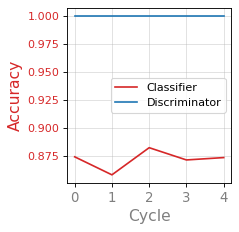

In [19]:
R.plot()

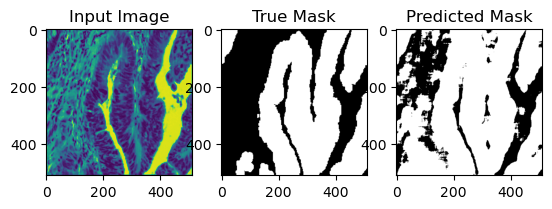

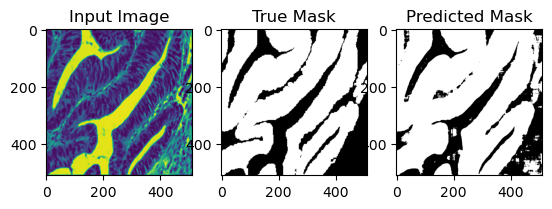

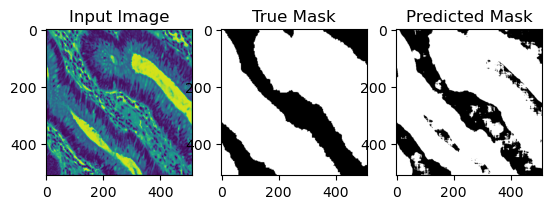

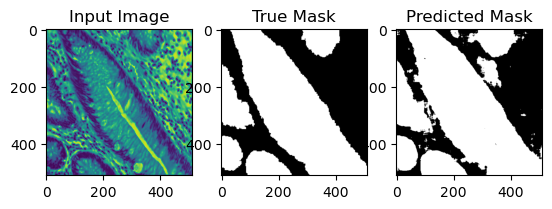

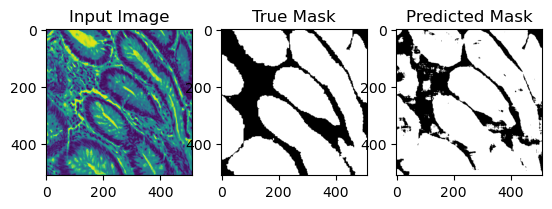

...

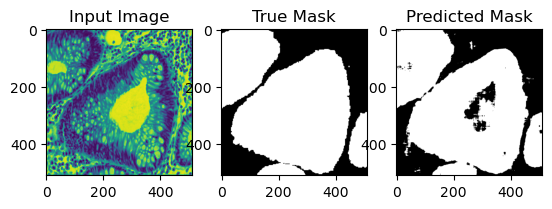

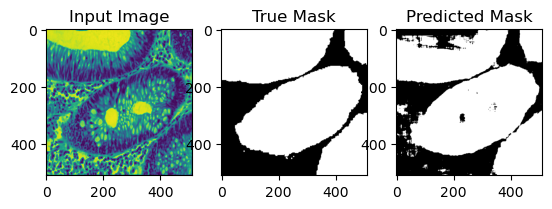

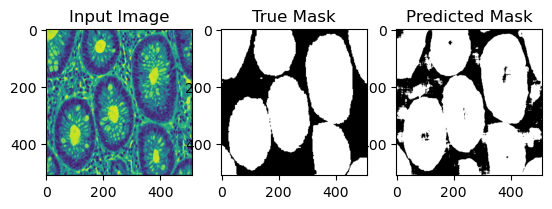

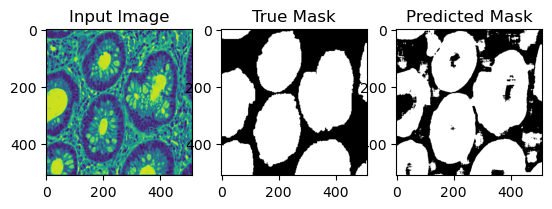

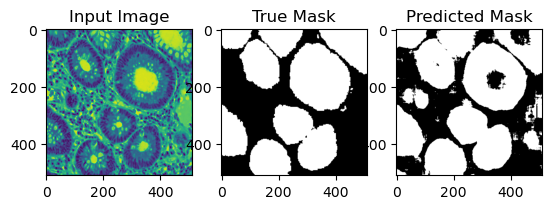

In [20]:
gp2.Util.visualize_predictions(C, X_test, y_test, num_samples=100)

In [ ]:
y_pred = R.classifier.predict(X_test, y_test)

In [ ]:
y_pred

In [ ]:
BareBone = gp2.KUC_UNet2D(loss=loss_fx, model_path=barebone_model)

In [ ]:
barebone_pred = BareBone.predict(X_test, y_test)

In [ ]:
barebone_pred

In [ ]:
BareBone.model.metrics_names